# Deep models interpretability
This notebooks shows examples of approaches for interpretation of (pre-)trained model predictions.

In [50]:
try:
    import skimage
except ModuleNotFoundError:
    import subprocess as sp
    result = sp.run(
        ['pip3', 'install', 'scikit-image'],
        stdout=sp.PIPE, stderr=sp.PIPE
    )

    if result.returncode != 0:
        print(result.stdout.decode('utf-8'))
        print(result.stderr.decode('utf-8'))

    import skimage

In [51]:
import urllib
import torch, torch.nn as nn
import torch.nn.functional as F
import torchvision.models

import numpy as np
from skimage.transform import resize
import matplotlib.pyplot as plt
%matplotlib inline

In [52]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('device:', device)

### please, don't remove the following line
x = torch.tensor([1], dtype=torch.float32).to(device)

device: cuda


In [53]:
# load imagenet class names
import requests
response = requests.get('https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json')
class_labels = {int(key): value for key, (code, value) in response.json().items()}

In [54]:
class_labels[897]

'washer'

### Task I: manual explanation with smoothgrad (2 points)

Let us begin by implementing our own little explainer for [DenseNet121](https://arxiv.org/abs/1608.06993) pretrained on ImageNet.

For the sake of simplicity, we're gonna rely on [SmoothGrad](https://arxiv.org/pdf/1706.03825.pdf) explainer - a simple average of gradients over noisy inputs.

In [55]:
# model = torchvision.models.densenet121(pretrained=True).train(False).to(device)
model = torchvision.models.resnet50(pretrained=True).train(False).to(device)

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.


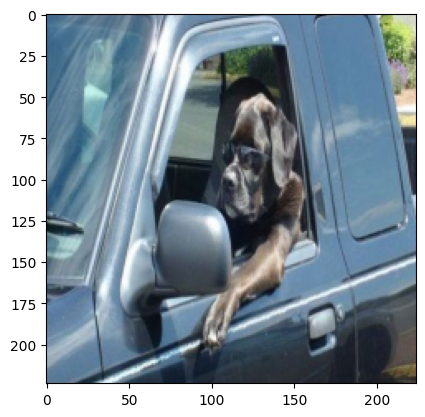

#1: p=0.853	bloodhound (163)
#2: p=0.039	washer (897)
#3: p=0.009	car_mirror (475)
#4: p=0.008	pickup (717)
#5: p=0.008	Weimaraner (178)
#6: p=0.007	Labrador_retriever (208)
#7: p=0.006	Chesapeake_Bay_retriever (209)
#8: p=0.005	limousine (627)
#9: p=0.004	pug (254)
#10: p=0.003	tub (876)


In [56]:
!wget -q https://cdn2.adrianflux.co.uk/wp-fluxposure/uploads/2014/08/no-7.jpg -O img.jpg

image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
plt.imshow(image)
plt.show()

with torch.no_grad():
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)
    probs = torch.softmax(model(image_tensor), dim=-1)[0]

for i, class_ix in enumerate(probs.argsort(descending=True)[:10]):
    print(f"#{i + 1}: p={probs[class_ix].item():.3f}\t{class_labels[class_ix.item()]} ({class_ix.item()})")

Now let's implement SmoothGrad itself.

Method 1 with normalization to ensure gradient values within the range [0, 1] for visualization purposes





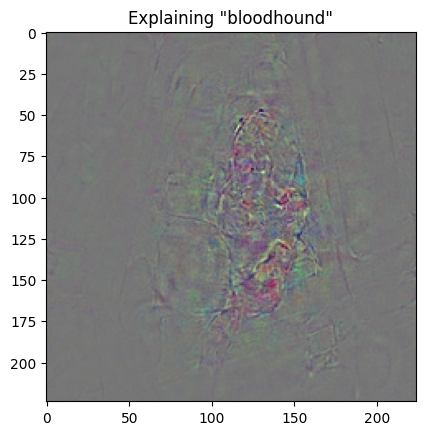

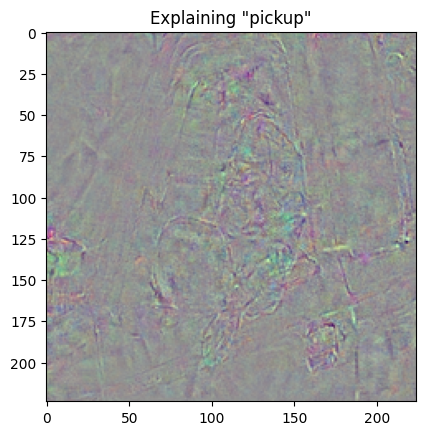

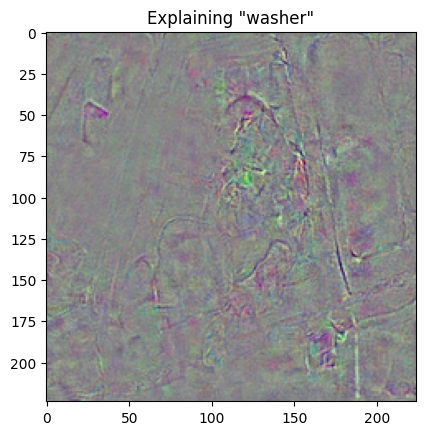

In [57]:
def explain_smoothgrad(image: torch.Tensor, class_ix, num_runs=32, sigma=0.1):
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)  # shape: [1, 3, h, w]

    average_gradients = torch.zeros_like(image_tensor)  # Initialize the average gradients.

    for _ in range(num_runs):
        # Create a noisy image with random noise.
        noisy_image = image_tensor + sigma * torch.randn_like(image_tensor)

        # Zero the gradients before computing new gradients.
        noisy_image.requires_grad = True
        optimizer = torch.optim.SGD([noisy_image], lr=0)  # Create an optimizer to zero gradients.

        # Compute the gradients for the specified class.
        logit = model(noisy_image)
        logit_class = logit[0][class_ix]
        logit_class.backward(retain_graph=True)  # Specify retain_graph=True to retain the graph.

        # Get the gradients.
        gradients = torch.autograd.grad(logit_class, noisy_image)[0]

        # Accumulate gradients.
        average_gradients += gradients

    # Average the accumulated gradients.
    average_gradients /= num_runs

    # Reshape the gradients to the original image shape (h, w, 3).
    average_gradients = average_gradients[0].permute(1, 2, 0).cpu().numpy()

    # Normalize gradient values to be in the [0, 1] range for visualization.
    average_gradients = (average_gradients - average_gradients.min()) / (average_gradients.max() - average_gradients.min())

    assert tuple(average_gradients.shape) == image.shape
    return abs(average_gradients)

for class_ix in 163, 717, 897:  # <-- insert your classes here, use numbers in (brackets)
    plt.title(f'Explaining "{class_labels[class_ix]}"')
    plt.imshow(explain_smoothgrad(image, class_ix), cmap='gray')
    plt.show()


Without normalization

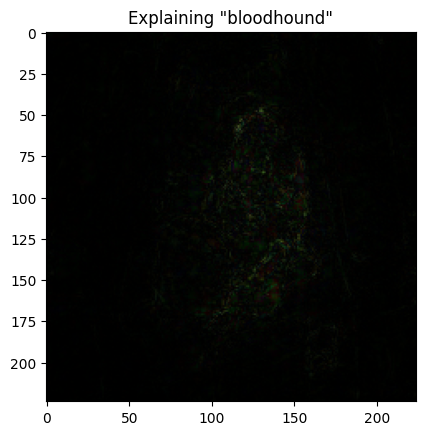

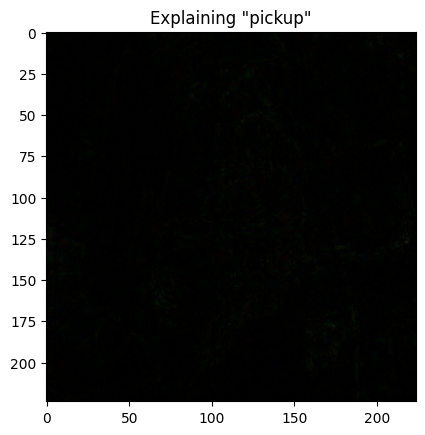

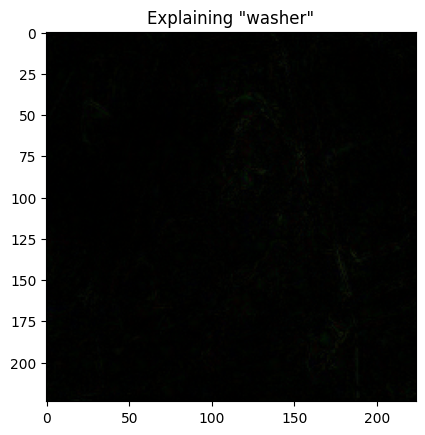

In [ ]:
def explain_smoothgrad(image: torch.Tensor, class_ix, num_runs=32, sigma=0.1):
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)  # shape: [1, 3, h, w]

    # 1. create :num_runs: copies of an image
    # 2. apply independent random noise to each copy, use N(0, sigma) distribution
    # 3. compute gradients of logit for class_ix w.r.t. input pixels
    # 4. average these gradients across different images
    # 5. re-shape these gradients in the same shape as original image: (h, w, 3)

    #<YOUR CODE HERE>
    average_gradients = torch.zeros_like(image_tensor)  # Initialize the average gradients.

    for _ in range(num_runs):
        # Create a noisy image with random noise.
        noisy_image = image_tensor + sigma * torch.randn_like(image_tensor)

        # Zero the gradients before computing new gradients.
        noisy_image.requires_grad = True
        optimizer = torch.optim.SGD([noisy_image], lr=0)  # Create an optimizer to zero gradients.

        # Compute the gradients for the specified class.
        logit = model(noisy_image)
        logit_class = logit[0][class_ix]
        logit_class.backward(retain_graph=True)  # Specify retain_graph=True to retain the graph.

        # Get the gradients.
        gradients = torch.autograd.grad(logit_class, noisy_image)[0]

        # Accumulate gradients.
        average_gradients += gradients

    # Average the accumulated gradients.
    average_gradients /= num_runs

    # Reshape the gradients to the original image shape (h, w, 3).
    average_gradients = average_gradients[0].permute(1, 2, 0).cpu().numpy()

    assert tuple(average_gradients.shape) == image.shape
    return abs(average_gradients)


for class_ix in 163, 717, 897:  # <-- insert your classes here, use numbers in (brackets)
    plt.title(f'Explaining "{class_labels[class_ix]}"')
    plt.imshow(explain_smoothgrad(image, class_ix), cmap='gray')
    plt.show()

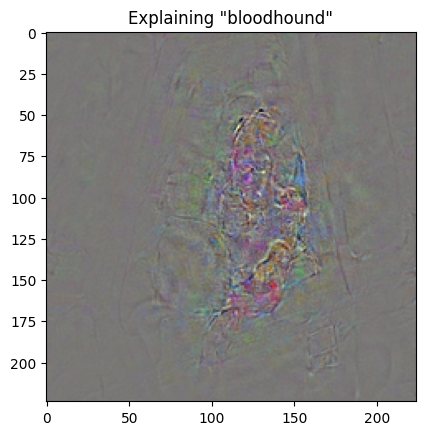

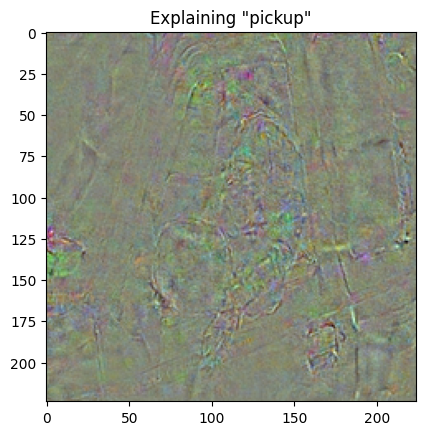

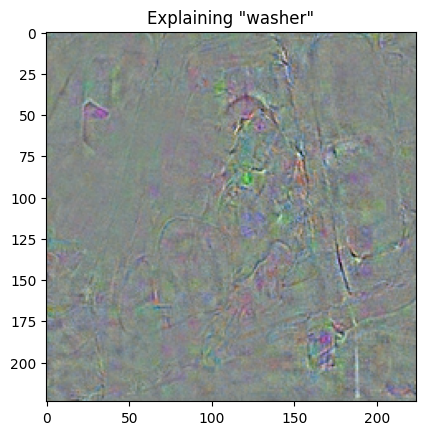

In [58]:
def explain_smoothgrad(image: torch.Tensor, class_ix, num_runs=32, sigma=0.1):
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)  # shape: [1, 3, h, w]

    # 1. create :num_runs: copies of an image
    images = image_tensor.repeat(num_runs, 1, 1, 1)

    # 2. apply independent random noise to each copy, use N(0, sigma) distribution
    noise = torch.randn_like(images) * sigma
    images_noisy = images + noise

    # 3. compute gradients of logit for class_ix w.r.t. input pixels
    images_noisy.requires_grad_(True)
    logits = model(images_noisy)
    loss = logits[:, class_ix].sum()
    model.zero_grad()
    loss.backward()

    # 4. average these gradients across different images
    average_gradients = images_noisy.grad.mean(0)

    # 5. re-shape these gradients in the same shape as original image: (h, w, 3)
    average_gradients = average_gradients.permute(1, 2, 0).cpu().numpy()

    # Normalize gradient values to be in the [0, 1] range for visualization.
    for i in range(3):  # for each channel
        channel = average_gradients[:, :, i]
        channel = (channel - channel.min()) / (channel.max() - channel.min())
        average_gradients[:, :, i] = channel

    return abs(average_gradients)
for class_ix in 163, 717, 897:  # <-- insert your classes here, use numbers in (brackets)
    plt.title(f'Explaining "{class_labels[class_ix]}"')
    plt.imshow(explain_smoothgrad(image, class_ix), cmap='gray')
    plt.show()

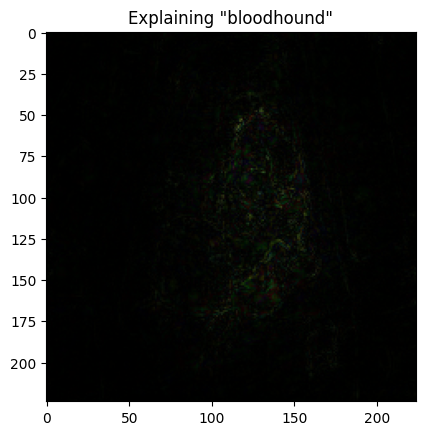

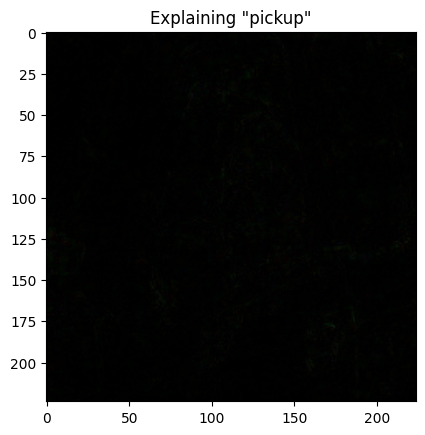

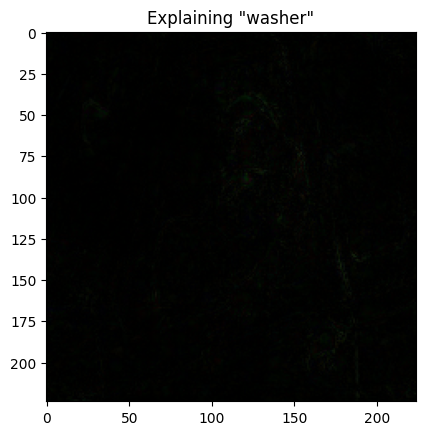

In [9]:
def explain_smoothgrad(image: torch.Tensor, class_ix, num_runs=32, sigma=0.1):
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)  # shape: [1, 3, h, w]

    # 1. create :num_runs: copies of an image
    images = image_tensor.repeat(num_runs, 1, 1, 1)

    # 2. apply independent random noise to each copy, use N(0, sigma) distribution
    noise = torch.randn_like(images) * sigma
    images_noisy = images + noise

    # 3. compute gradients of logit for class_ix w.r.t. input pixels
    images_noisy.requires_grad_(True)
    logits = model(images_noisy)
    loss = logits[:, class_ix].sum()
    model.zero_grad()
    loss.backward()

    # 4. average these gradients across different images
    average_gradients = images_noisy.grad.mean(0)

    # 5. re-shape these gradients in the same shape as original image: (h, w, 3)
    return abs(average_gradients.permute(1, 2, 0).cpu().numpy())

for class_ix in 163, 717, 897:  # <-- insert your classes here, use numbers in (brackets)
    plt.title(f'Explaining "{class_labels[class_ix]}"')
    plt.imshow(explain_smoothgrad(image, class_ix), cmap='gray')
    plt.show()

__Let's try it out!__ Peter Higgs nobel prize photo

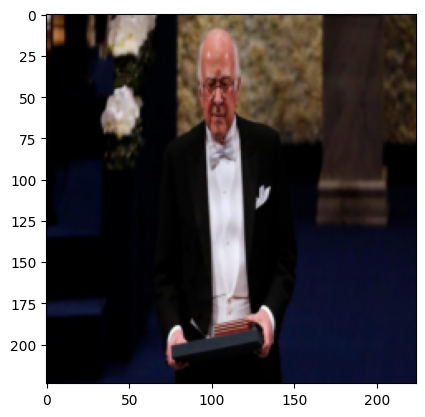

#1: p=0.211	suit (834)
#2: p=0.049	toilet_seat (861)
#3: p=0.040	plunger (731)
#4: p=0.032	vacuum (882)
#5: p=0.026	guillotine (583)
#6: p=0.024	balance_beam (416)
#7: p=0.023	academic_gown (400)
#8: p=0.022	torch (862)
#9: p=0.019	lab_coat (617)
#10: p=0.017	hook (600)


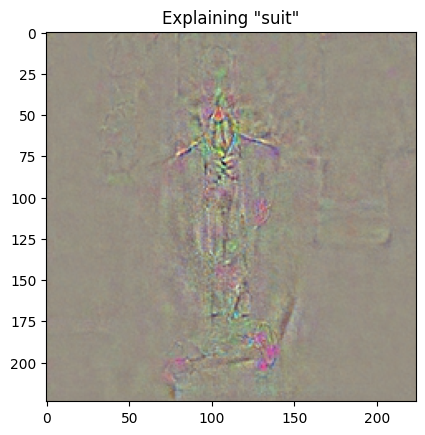

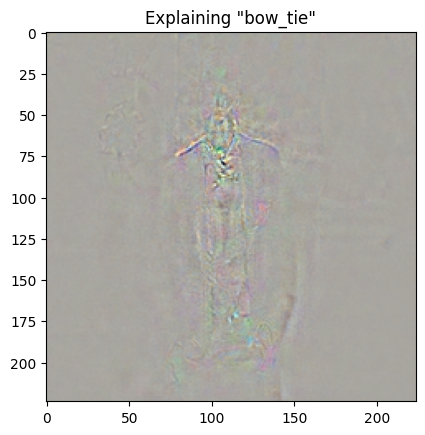

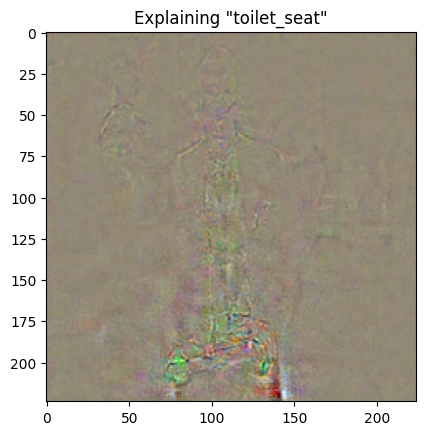

In [59]:
!wget -q https://i.pinimg.com/originals/3a/e1/83/3ae18369ab2e86be83e637ad702ec832.jpg -O img.jpg

image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
plt.imshow(image)
plt.show()

with torch.no_grad():
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)
    probs = torch.softmax(model(image_tensor), dim=-1)[0]

for i, class_ix in enumerate(probs.argsort(descending=True)[:10]):
    print(f"#{i + 1}: p={probs[class_ix].item():.3f}\t{class_labels[class_ix.item()]} ({class_ix.item()})")

for class_ix in 834, 457, 861:
    plt.title(f'Explaining "{class_labels[class_ix]}"')
    plt.imshow(explain_smoothgrad(image, class_ix), cmap='gray')
    plt.show()

### SHapley Additive exPlanations
Now, let's try something heavier. The current state of the art in explaining model predictions is [SHAP](https://arxiv.org/abs/1705.07874): Shapley Additive Explanations.

This method is based on [Shapley values](https://en.wikipedia.org/wiki/Shapley_value) - a game-theoretic concept that evaluates the contribution of individual players in a cooperative game. Except this time our "players" are input features and the "game" is predicting whichever output the model gave.

Computing Shapley values naively requires $O(F!)$ time where F is the number of features. To make this computation more feasible, authors [proposed](https://arxiv.org/abs/1705.07874) several approximations, one of which relies on averaged gradients. This approximation also requires "background" data - other images similar to the ones in question that can be used as reference points.

In [60]:
try:
    import shap
except ModuleNotFoundError:
    import subprocess as sp
    result = sp.run(
        ['pip3', 'install', 'shap'],
        stdout=sp.PIPE, stderr=sp.PIPE
    )

    if result.returncode != 0:
        print(result.stdout.decode('utf-8'))
        print(result.stderr.decode('utf-8'))

    import shap

In [61]:
shap.initjs()

# load "background" images - some 50 random images from ImageNet
background, _ = shap.datasets.imagenet50()
background = torch.as_tensor(background / 255.0, device=device, dtype=torch.float32)
background = background.permute(0, 3, 1, 2)

In [62]:
background.size()

torch.Size([50, 3, 224, 224])

In [63]:
# image to explain
!wget -q https://i.pinimg.com/originals/32/da/5c/32da5c3314fcc5ebf1a7b7d1548fcb03.jpg -O img.jpg
image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
image_tensor = torch.as_tensor(image[None], device=device, dtype=torch.float32).permute(0, 3, 1, 2)

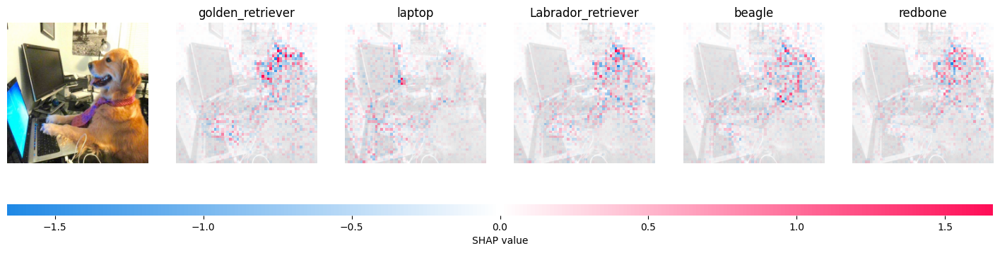

In [64]:
# explain and visualize. If you're not using a powerful V100 GPU, this may take up to 20 minutes.
explainer = shap.GradientExplainer((model, model.layer1), background)
shap_values, indices = explainer.shap_values(image_tensor, ranked_outputs=5, nsamples=200)
shap_values = [np.transpose(values, (0, 2, 3, 1)) for values in shap_values]
index_names = np.vectorize(lambda i: class_labels[i])(indices.cpu().numpy())
shap.image_plot(shap_values, image_tensor.permute(0, 2, 3, 1).cpu().numpy(), index_names)

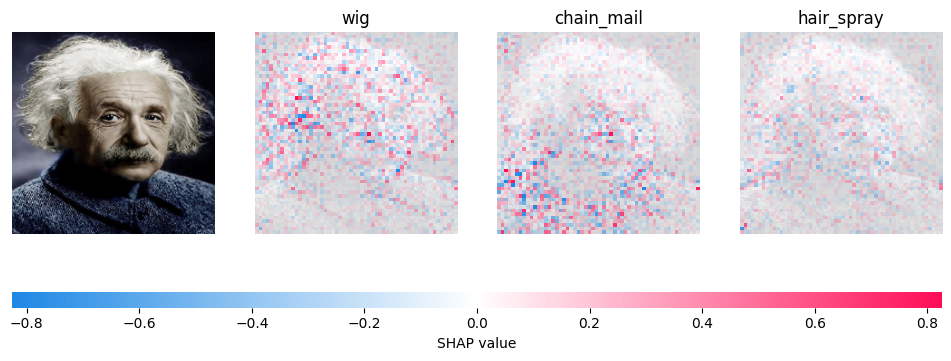

In [65]:
# obligatory physicist reference
!wget -q https://images-na.ssl-images-amazon.com/images/I/51ArQaCkkZL._AC_.jpg -O img.jpg
image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
image_tensor = torch.as_tensor(image[None], device=device, dtype=torch.float32).permute(0, 3, 1, 2)
explainer = shap.GradientExplainer((model, model.layer1), background)
shap_values, indices = explainer.shap_values(image_tensor, ranked_outputs=3, nsamples=200)
shap_values = [np.transpose(values, (0, 2, 3, 1)) for values in shap_values]
index_names = np.vectorize(lambda i: class_labels[i])(indices.cpu().numpy())
shap.image_plot(shap_values, image_tensor.permute(0, 2, 3, 1).cpu().numpy(), index_names)

###### Explaining classical machine learning models

Finally, let's see how SHAP explainers can be applied to more conventional machine learning models like gradient boosting.

Spoiler: exactly the same from a user's perspective. However, this time we're gonna use a different Shapley approximation implemented in TreeExplainer. For a full set of available explainers, take a look at their official [examples page](https://github.com/slundberg/shap/tree/master/notebooks).

**NB: the following cells requires JavaScript support and should work in Jupyter (not JupyterLab or cocalc)**.
In that case try running it on Google colab: https://colab.research.google.com/github/yandexdataschool/mlhep2020-assignments/blob/master/notebooks/interpretability/interpretability_demo.ipynb

In [66]:
!pip install catboost

In [67]:
import catboost
import shap
from sklearn.datasets import fetch_california_housing
shap.initjs()

# Load the California housing dataset
data = fetch_california_housing()
X, y = data.data, data.target

ensemble = catboost.CatBoostRegressor(iterations=100, learning_rate=0.1)
ensemble.fit(X, y, verbose=False, plot=False)

# Create a SHAP TreeExplainer for the CatBoost model
explainer = shap.TreeExplainer(ensemble)
shap_values = explainer.shap_values(X)

# Visualize explanations for the first example
shap.force_plot(explainer.expected_value, shap_values[0, :], X[0, :])



In [ ]:
# Explain training data: each *column* is a rotated plot from above, stacked for all training samples
# (this plot is interactive, hover mouse to see feature names)
shap.force_plot(explainer.expected_value, shap_values, X)

shap.plots.force is slow for many thousands of rows, try subsampling your data.


KeyboardInterrupt: ignored

### Task II: Explain Intermediate Layers of Resnet50 on ImageNet (5 points)

Sometimes, computing explanations w.r.t. pixels is more difficult (and less interpretable) than using intermediate layers that are closer to the "output" layer. The trick is to compute low-resolution explanations of output w.r.t. intermediate layer and then resizing them to fit the original image.

Each layer in deep CNN learns filters of increasing complexity. The first layers learn basic feature detection filters such as edges and corners. The middle layers learn filters that detect parts of objects — for faces, they might learn to respond to features like eyes and brows, and deeper layers capture entire objects.

**Your task** is to explain ResNet50 model outputs with respect to the convolution module from 2nd  and 4th layer of the pretrained Resnet50 network using the same GradientExplainer. *The task may require some googling or browsing the [docs](https://shap.readthedocs.io/en/latest) :)*

**Please use at least 10 images from across the internet (or from ImageNet) and compare the 2nd and 4th layer explanations on these images.**


In [68]:
# Get intermediate layers
layer2 = model.layer2[-1]  # last module in layer2
layer4 = model.layer4[-1]  # last module in layer4


In [69]:
def explain_with_layer(image_tensor, layer):
    explainer = shap.GradientExplainer((model, layer), background)
    shap_values, indices = explainer.shap_values(image_tensor, ranked_outputs=5, nsamples=200)
    shap_values = [np.transpose(values, (0, 2, 3, 1)) for values in shap_values]
    index_names = np.vectorize(lambda i: class_labels[i])(indices.cpu().numpy())
    shap.image_plot(shap_values, image_tensor.permute(0, 2, 3, 1).cpu().numpy(), index_names)


Explanation with Layer 2:


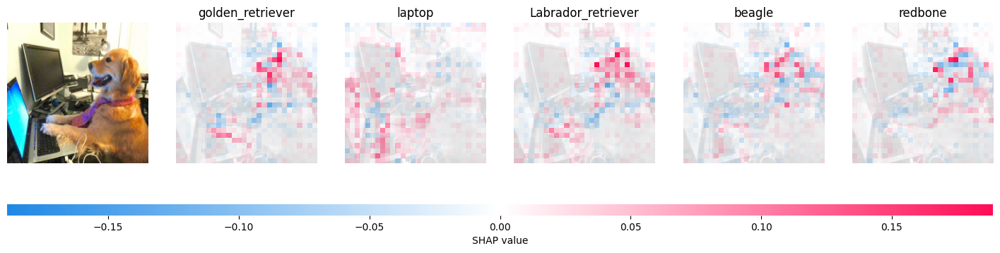

Explanation with Layer 4:


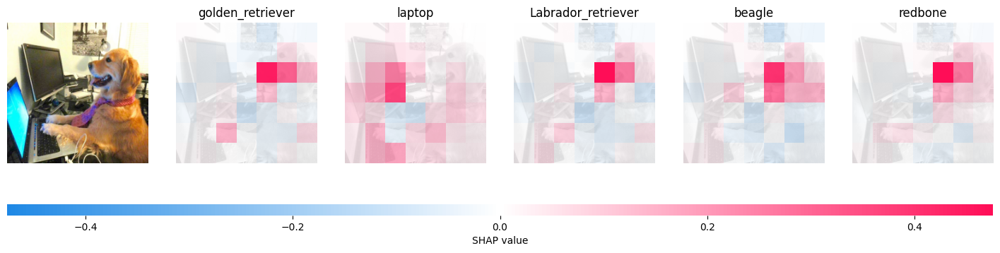

Explanation with Layer 2:


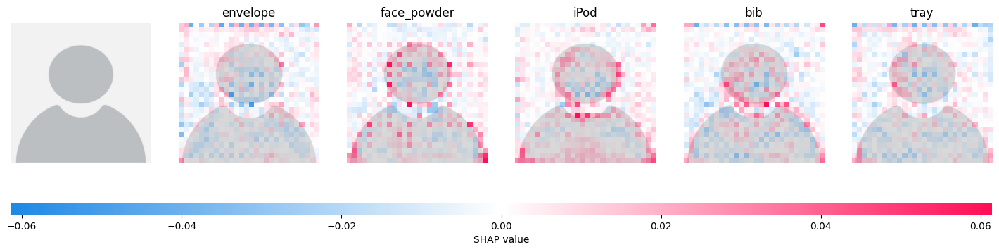

Explanation with Layer 4:


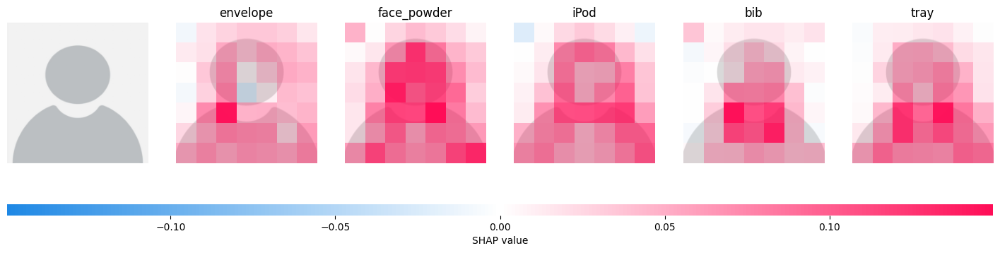

Explanation with Layer 2:


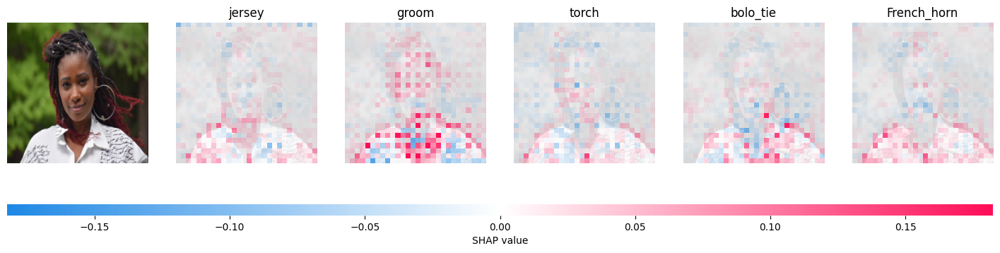

Explanation with Layer 4:


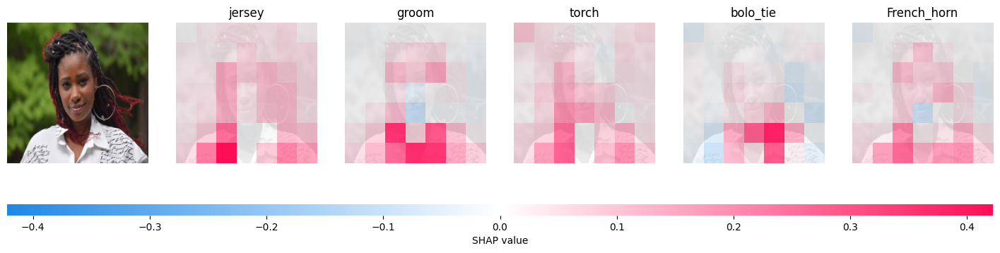

Explanation with Layer 2:


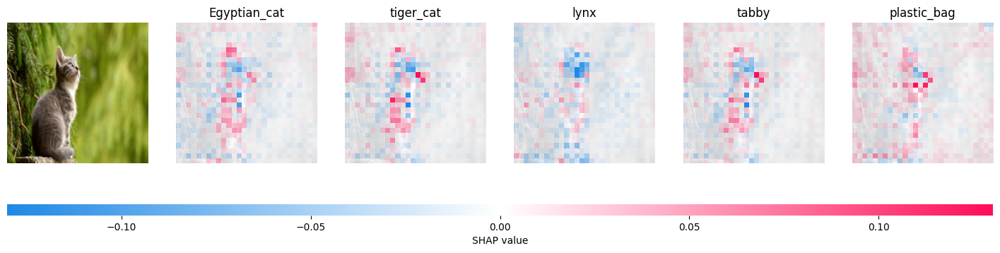

Explanation with Layer 4:


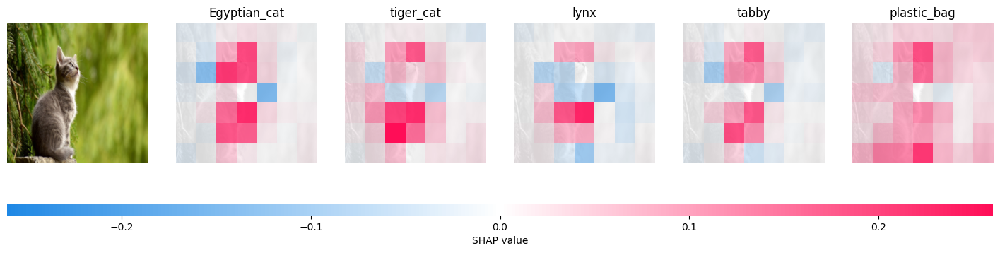

Explanation with Layer 2:


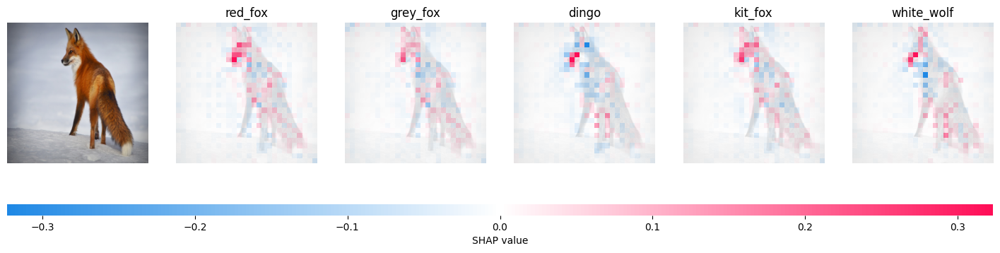

Explanation with Layer 4:


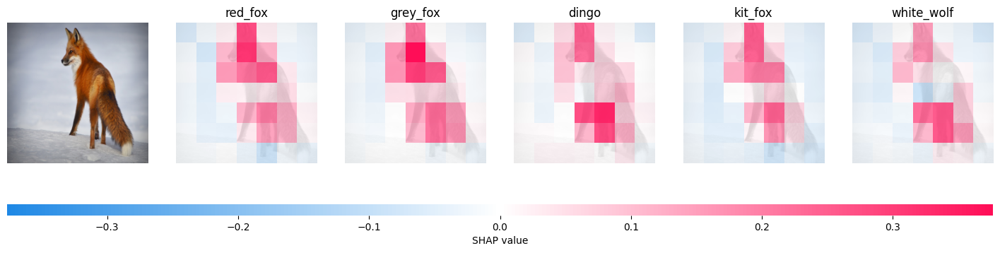

Explanation with Layer 2:


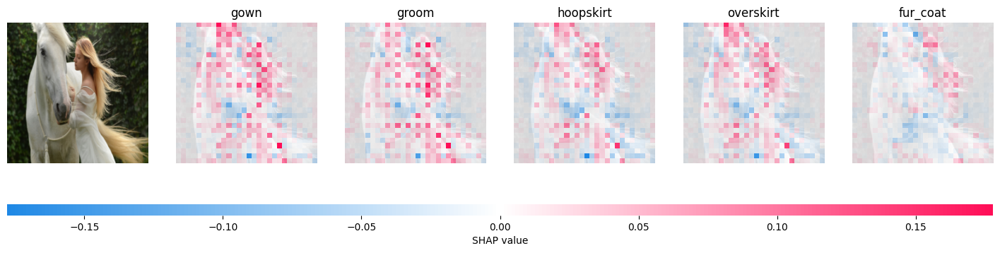

Explanation with Layer 4:


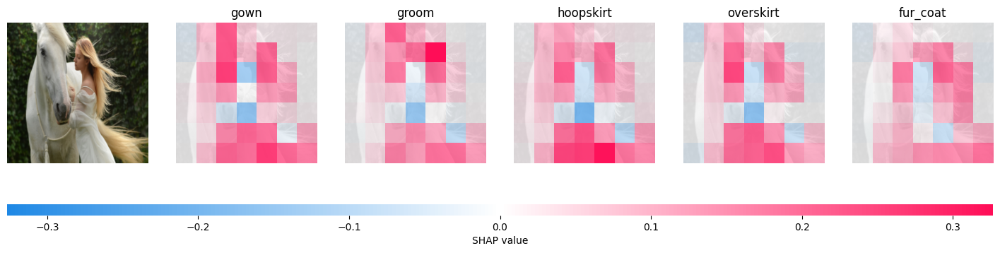

Explanation with Layer 2:


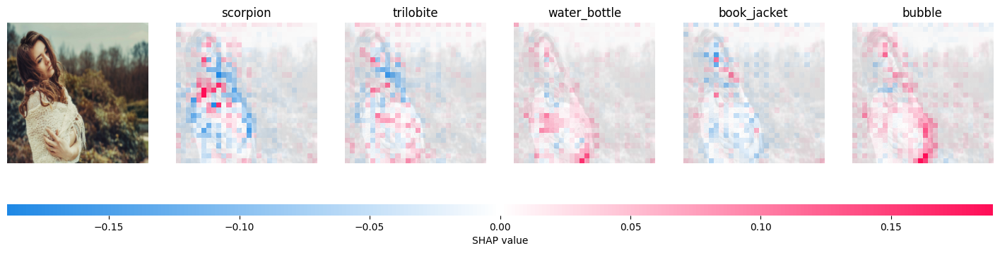

Explanation with Layer 4:


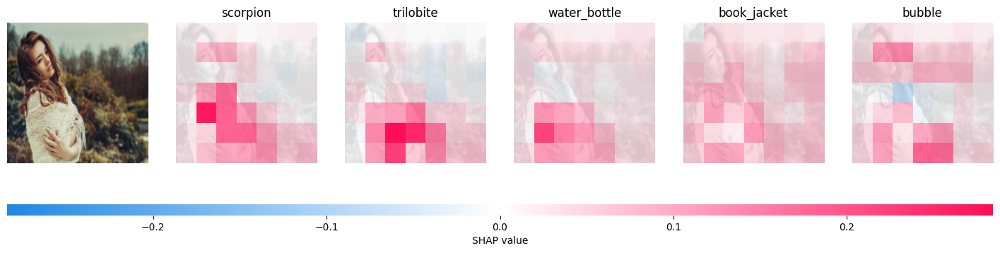

Explanation with Layer 2:


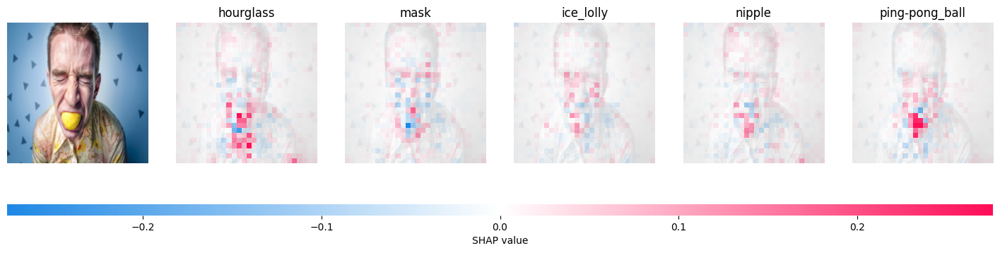

Explanation with Layer 4:


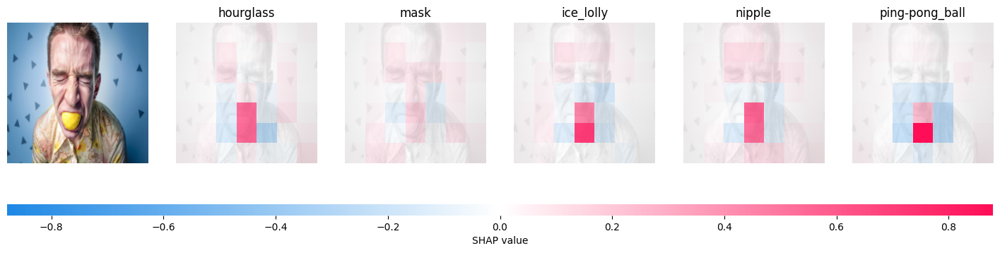

Explanation with Layer 2:


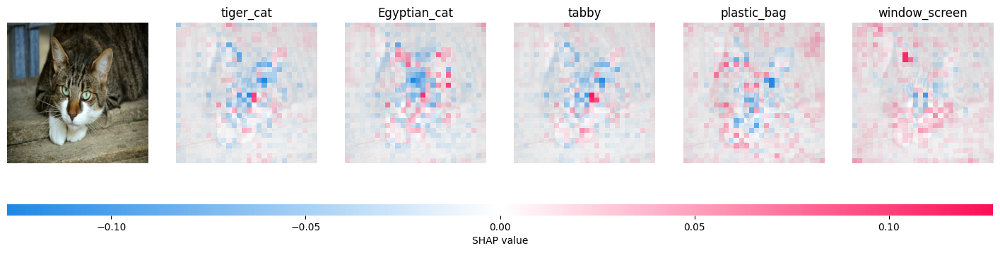

Explanation with Layer 4:


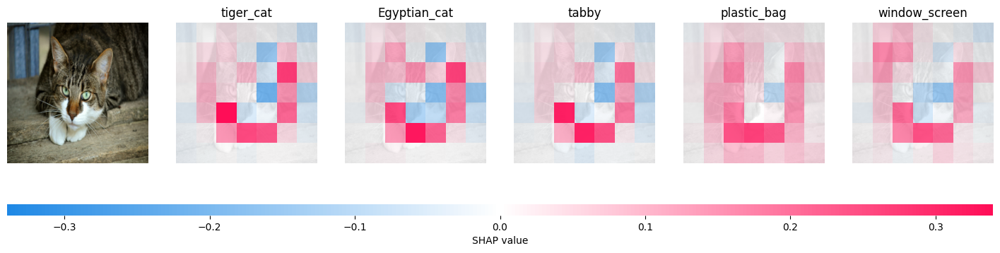

Explanation with Layer 2:


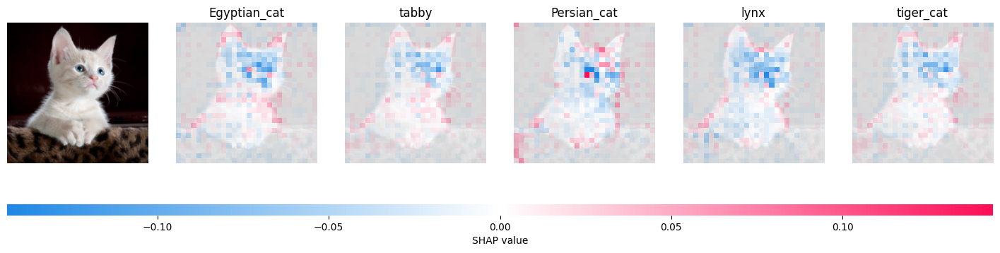

Explanation with Layer 4:


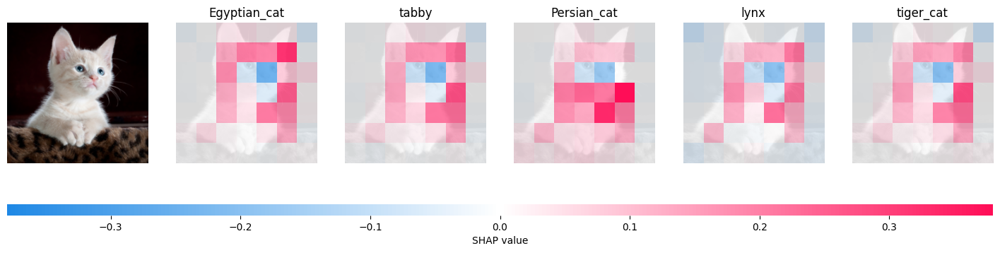

Explanation with Layer 2:


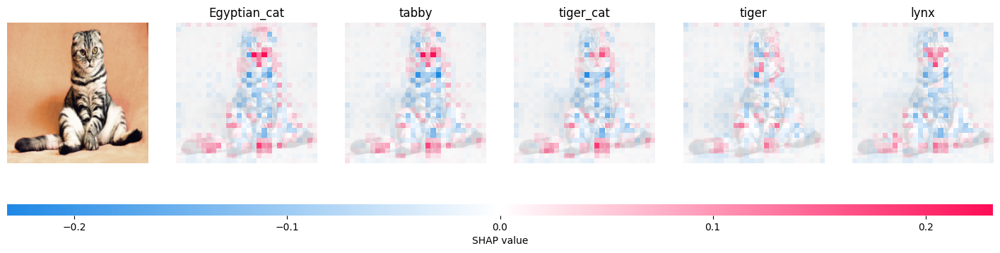

Explanation with Layer 4:


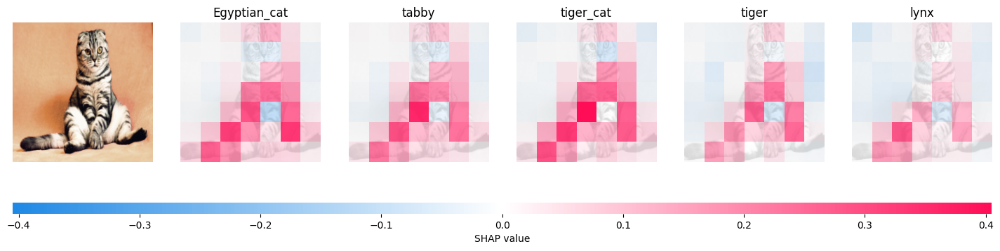

Explanation with Layer 2:


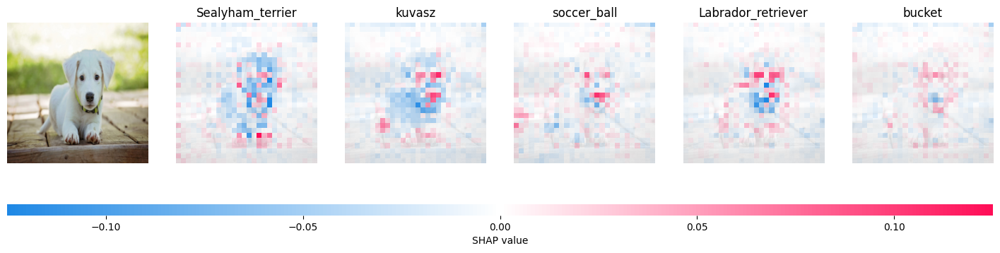

Explanation with Layer 4:


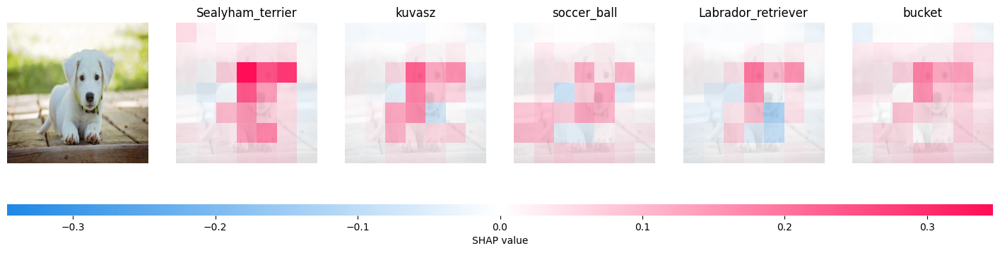

In [70]:
image_urls = [
    "https://i.pinimg.com/originals/32/da/5c/32da5c3314fcc5ebf1a7b7d1548fcb03.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/b/bc/Unknown_person.jpg",
    "https://cdn.pixabay.com/photo/2023/09/06/13/47/woman-8237167_1280.jpg",
    "https://cdn.pixabay.com/photo/2017/02/20/18/03/cat-2083492_1280.jpg",
    "https://cdn.pixabay.com/photo/2020/03/01/15/30/fox-4893199_1280.jpg",
    "https://cdn.pixabay.com/photo/2018/07/21/03/55/woman-3551832_1280.jpg",
    "https://cdn.pixabay.com/photo/2015/07/09/00/29/woman-837156_1280.jpg",
    "https://cdn.pixabay.com/photo/2015/04/27/22/53/man-742766_1280.jpg",
    "https://cdn.pixabay.com/photo/2017/08/23/08/33/cats-eyes-2671903_1280.jpg",
    "https://cdn.pixabay.com/photo/2014/11/30/14/11/cat-551554_1280.jpg",
    "https://cdn.pixabay.com/photo/2017/11/09/21/41/cat-2934720_1280.jpg",
     "https://cdn.pixabay.com/photo/2016/12/13/05/15/puppy-1903313_1280.jpg"

]




for image_url in image_urls:
    !wget -q {image_url} -O img.jpg
    image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
    image_tensor = torch.as_tensor(image[None], device=device, dtype=torch.float32).permute(0, 3, 1, 2)

    print("Explanation with Layer 2:")
    explain_with_layer(image_tensor, layer2)

    print("Explanation with Layer 4:")
    explain_with_layer(image_tensor, layer4)


The output visualizations depict the influence of each pixel (or group of pixels) on the classification outcome using SHAP values. The warmer the color (towards red), the higher the positive influence, and the cooler the color (towards blue), the higher the negative influence on the final prediction.

Let's break down the visualizations:

1. **Explanation with Layer 2**:
   - This layer, being an early layer in the network, is expected to detect low-level features like edges, textures, and basic color patterns. The explanations are relatively dispersed and fine-grained, highlighting multiple areas in the image.
   - For example, in the "golden_retriever" prediction, various parts of the dog, like its fur and areas around its face, are highlighted, suggesting these regions have a significant impact on that particular classification.

2. **Explanation with Layer 4**:
   - Being deeper in the network, this layer captures more abstract features and parts of objects. The explanations are coarser, focusing on larger, more distinct areas of the image.
   - In the "golden_retriever" prediction, a few larger areas of the dog are highlighted, such as its face and upper body, suggesting these are the regions that most strongly support the model's decision.

A few takeaways from these visualizations:
- The difference in granularity between the two layers is evident. Early layers offer more localized, pixel-level explanations, while deeper layers provide broader, region-level insights.
- Certain object parts have a strong influence on specific classifications. For instance, the screen and keyboard region for the "laptop" prediction or the facial region for different dog breeds.
- The regions with no color overlay are those pixels that didn't significantly influence the model's prediction for the given class.

These explanations can be valuable in understanding what regions of an image drive the model's decisions and can help diagnose potential biases or inaccuracies in the model's predictions.

## References

* SHAP explainer based on superpixels - [notebook](https://slundberg.github.io/shap/notebooks/ImageNet%20VGG16%20Model%20with%20Keras.html)
* SHAP reference notebook - [view on github](https://github.com/slundberg/shap/tree/master/notebooks)
* More various explainers in [ELI5](https://github.com/TeamHG-Memex/eli5)
* Same notebook on Google [Colab](https://colab.research.google.com/github/yandexdataschool/mlhep2020-assignments/blob/master/notebooks/interpretability/interpretability_demo.ipynb)